
# Part 1: Under The Problem Statement and Business Case

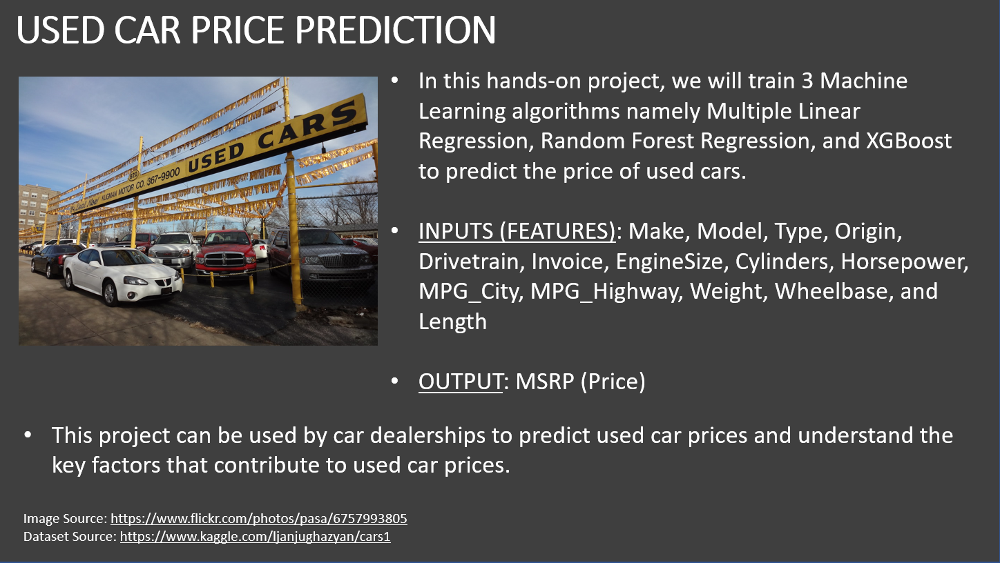


# Part 2: Exploratory Data Analysis

In [ ]:
# Necessary Libraries

# !pip install xgboost
# !pip install wordcloud
# !pip install plotly
# !pip install jupyterthemes

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # interactive data visualization

from jupyterthemes import jtplot # Jupyter Notebook Theme
jtplot.style(theme = 'monokai', context = 'notebook', ticks = True, grid = False) 

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot # Offline version of the Plotly modules.

In [49]:
# Read the CSV file 
cars = pd.read_csv('./data/cars_data.csv')

In [50]:
# Load the top 10 instances
cars.head(10)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,"$36,945","$33,337",3.5,6.0,265,17,23,4451,106,189
1,Acura,RSX Type S 2dr,Sedan,Asia,Front,"$23,820","$21,761",2.0,4.0,200,24,31,2778,101,172
2,Acura,TSX 4dr,Sedan,Asia,Front,"$26,990","$24,647",2.4,4.0,200,22,29,3230,105,183
3,Acura,TL 4dr,Sedan,Asia,Front,"$33,195","$30,299",3.2,6.0,270,20,28,3575,108,186
4,Acura,3.5 RL 4dr,Sedan,Asia,Front,"$43,755","$39,014",3.5,6.0,225,18,24,3880,115,197
5,Acura,3.5 RL w/Navigation 4dr,Sedan,Asia,Front,"$46,100","$41,100",3.5,6.0,225,18,24,3893,115,197
6,Acura,NSX coupe 2dr manual S,Sports,Asia,Rear,"$89,765","$79,978",3.2,6.0,290,17,24,3153,100,174
7,Audi,A4 1.8T 4dr,Sedan,Europe,Front,"$25,940","$23,508",1.8,4.0,170,22,31,3252,104,179
8,Audi,A41.8T convertible 2dr,Sedan,Europe,Front,"$35,940","$32,506",1.8,4.0,170,23,30,3638,105,180
9,Audi,A4 3.0 4dr,Sedan,Europe,Front,"$31,840","$28,846",3.0,6.0,220,20,28,3462,104,179


In [51]:
# Load the bottom 10 instances 
cars.tail(10)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
418,Volvo,S60 2.5 4dr,Sedan,Europe,All,"$31,745","$29,916",2.5,5.0,208,20,27,3903,107,180
419,Volvo,S60 T5 4dr,Sedan,Europe,Front,"$34,845","$32,902",2.3,5.0,247,20,28,3766,107,180
420,Volvo,S60 R 4dr,Sedan,Europe,All,"$37,560","$35,382",2.5,5.0,300,18,25,3571,107,181
421,Volvo,S80 2.9 4dr,Sedan,Europe,Front,"$37,730","$35,542",2.9,6.0,208,20,28,3576,110,190
422,Volvo,S80 2.5T 4dr,Sedan,Europe,All,"$37,885","$35,688",2.5,5.0,194,20,27,3691,110,190
423,Volvo,C70 LPT convertible 2dr,Sedan,Europe,Front,"$40,565","$38,203",2.4,5.0,197,21,28,3450,105,186
424,Volvo,C70 HPT convertible 2dr,Sedan,Europe,Front,"$42,565","$40,083",2.3,5.0,242,20,26,3450,105,186
425,Volvo,S80 T6 4dr,Sedan,Europe,Front,"$45,210","$42,573",2.9,6.0,268,19,26,3653,110,190
426,Volvo,V40,Wagon,Europe,Front,"$26,135","$24,641",1.9,4.0,170,22,29,2822,101,180
427,Volvo,XC70,Wagon,Europe,All,"$35,145","$33,112",2.5,5.0,208,20,27,3823,109,186


In [52]:
# Display the feature columns
cars.columns

Index(['Make', 'Model', 'Type', 'Origin', 'DriveTrain', 'MSRP', 'Invoice',
       'EngineSize', 'Cylinders', 'Horsepower', 'MPG_City', 'MPG_Highway',
       'Weight', 'Wheelbase', 'Length'],
      dtype='object')

In [53]:
# Check the shape of the dataframe
cars.shape

(428, 15)

## Using Pandas Profiling

In [54]:
import pandas_profiling as pp

report = pp.ProfileReport(cars)
display(report)

# Export the report
report.to_file(output_file='used_car_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [55]:
# Check if any missing values are present in the dataframe
cars.isnull().sum()

Make           0
Model          0
Type           0
Origin         0
DriveTrain     0
MSRP           0
Invoice        0
EngineSize     0
Cylinders      2
Horsepower     0
MPG_City       0
MPG_Highway    0
Weight         0
Wheelbase      0
Length         0
dtype: int64

There is 2 missing values of `Cylinders`. We will drop these as dropping 2 won't have big impact.

In [56]:
cars = cars.dropna()

In [57]:
cars.isnull().sum()

Make           0
Model          0
Type           0
Origin         0
DriveTrain     0
MSRP           0
Invoice        0
EngineSize     0
Cylinders      0
Horsepower     0
MPG_City       0
MPG_Highway    0
Weight         0
Wheelbase      0
Length         0
dtype: int64

In [58]:
# Obtain the summary of the dataframe
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         426 non-null    object 
 1   Model        426 non-null    object 
 2   Type         426 non-null    object 
 3   Origin       426 non-null    object 
 4   DriveTrain   426 non-null    object 
 5   MSRP         426 non-null    object 
 6   Invoice      426 non-null    object 
 7   EngineSize   426 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   426 non-null    int64  
 10  MPG_City     426 non-null    int64  
 11  MPG_Highway  426 non-null    int64  
 12  Weight       426 non-null    int64  
 13  Wheelbase    426 non-null    int64  
 14  Length       426 non-null    int64  
dtypes: float64(2), int64(6), object(7)
memory usage: 53.2+ KB


In [59]:
cars.describe(include='all').round(2).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Make,426,38,Toyota,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model,426,423,C240 4dr,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,426,6,Sedan,262,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Origin,426,3,Asia,156,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DriveTrain,426,3,Front,226,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSRP,426,409,"$33,995",2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Invoice,426,423,"$19,638",2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EngineSize,426.0,NaN,NaN,NaN,3.21,1.1,1.4,2.4,3.0,3.9,8.3
Cylinders,426.0,NaN,NaN,NaN,5.81,1.56,3.0,4.0,6.0,6.0,12.0
Horsepower,426.0,NaN,NaN,NaN,215.88,71.99,73.0,165.0,210.0,255.0,500.0


### Cleaning up `MSRP` column

In [60]:
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,"$36,945","$33,337",3.5,6.0,265,17,23,4451,106,189


In [ ]:
pd.set_option('mode.chained_assignment', None) # to surpress warning

# Convert MSRP and Invoice datatype to integer so we need to remove $ sign and comma (,) from these 2 columns
cars['MSRP'] = cars['MSRP'].str.replace('$','', regex=True)
cars['MSRP'] = cars['MSRP'].str.replace(',','', regex=True)
cars['MSRP'] = cars['MSRP'].astype('int')

In [70]:
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,36945,"$33,337",3.5,6.0,265,17,23,4451,106,189


### Cleaning up `Invoice` column

In [ ]:
cars['Invoice'] = cars['Invoice'].str.replace('$', '', regex=True)
cars['Invoice'] = cars['Invoice'].str.replace(',', '', regex=True)
cars['Invoice'] = cars['Invoice'].astype('int')

In [72]:
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,36945,33337,3.5,6.0,265,17,23,4451,106,189


In [74]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         426 non-null    object 
 1   Model        426 non-null    object 
 2   Type         426 non-null    object 
 3   Origin       426 non-null    object 
 4   DriveTrain   426 non-null    object 
 5   MSRP         426 non-null    int32  
 6   Invoice      426 non-null    int32  
 7   EngineSize   426 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   426 non-null    int64  
 10  MPG_City     426 non-null    int64  
 11  MPG_Highway  426 non-null    int64  
 12  Weight       426 non-null    int64  
 13  Wheelbase    426 non-null    int64  
 14  Length       426 non-null    int64  
dtypes: float64(2), int32(2), int64(6), object(5)
memory usage: 49.9+ KB


In [73]:
# Display the updated summary of the dataframe
# Now MSRP and Invoice columns are cleaned
cars.describe(include='all').round(2).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Make,426,38,Toyota,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model,426,423,C240 4dr,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,426,6,Sedan,262,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Origin,426,3,Asia,156,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DriveTrain,426,3,Front,226,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSRP,426.0,NaN,NaN,NaN,32804.55,19472.46,10280.0,20324.75,27807.5,39225.0,192465.0
Invoice,426.0,NaN,NaN,NaN,30040.65,17679.43,9875.0,18836.0,25521.5,35754.75,173560.0
EngineSize,426.0,NaN,NaN,NaN,3.21,1.1,1.4,2.4,3.0,3.9,8.3
Cylinders,426.0,NaN,NaN,NaN,5.81,1.56,3.0,4.0,6.0,6.0,12.0
Horsepower,426.0,NaN,NaN,NaN,215.88,71.99,73.0,165.0,210.0,255.0,500.0


- What is the maximum/minium price of the used car?

In [75]:
cars['MSRP'].min(), cars['MSRP'].max()

(10280, 192465)

# Part 3: Data Visualization with Plotly Express

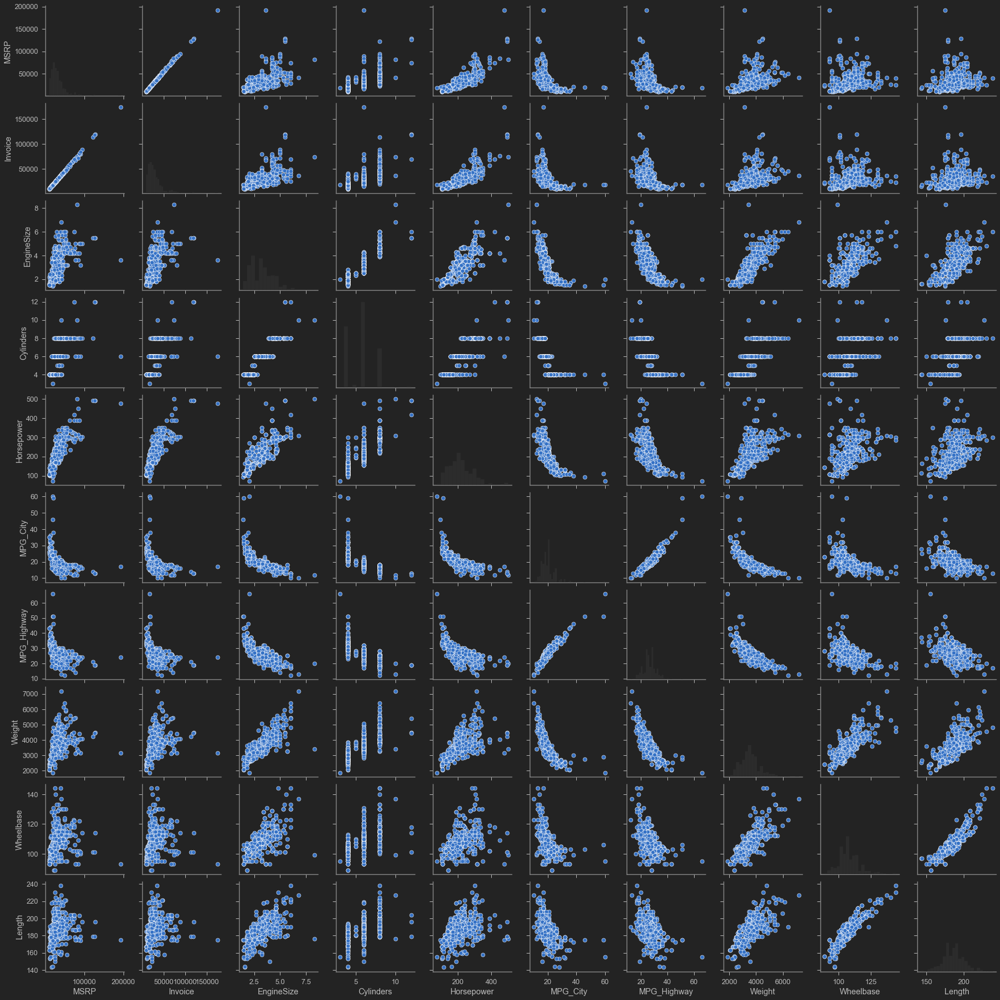

In [76]:
# scatterplots for joint relationships and histograms for univariate distributions
sns.pairplot(data=cars);

In [77]:
cars.columns

Index(['Make', 'Model', 'Type', 'Origin', 'DriveTrain', 'MSRP', 'Invoice',
       'EngineSize', 'Cylinders', 'Horsepower', 'MPG_City', 'MPG_Highway',
       'Weight', 'Wheelbase', 'Length'],
      dtype='object')

### `Make` Feature

In [78]:
# Let's view various makes of the cars
cars['Make'].unique()

array(['Acura', 'Audi', 'BMW', 'Buick', 'Cadillac', 'Chevrolet',
       'Chrysler', 'Dodge', 'Ford', 'GMC', 'Honda', 'Hummer', 'Hyundai',
       'Infiniti', 'Isuzu', 'Jaguar', 'Jeep', 'Kia', 'Land Rover',
       'Lexus', 'Lincoln', 'MINI', 'Mazda', 'Mercedes-Benz', 'Mercury',
       'Mitsubishi', 'Nissan', 'Oldsmobile', 'Pontiac', 'Porsche', 'Saab',
       'Saturn', 'Scion', 'Subaru', 'Suzuki', 'Toyota', 'Volkswagen',
       'Volvo'], dtype=object)

In [100]:
fig = px.histogram(data_frame=cars,
                              x='Make',
                              labels={'Make': 'Manufacturer'},
                              title='Make of the Car',
                              color_discrete_sequence=['blue']).update_xaxes(categoryorder='total descending')
fig.show();

### `Type` Feature

In [87]:
# Let's view various types of the cars
cars['Type'].unique()

array(['SUV', 'Sedan', 'Sports', 'Wagon', 'Truck', 'Hybrid'], dtype=object)

In [92]:
type_ordered = cars['Type'].value_counts().sort_values(ascending=False)
type_ordered

Sedan     262
SUV        60
Sports     47
Wagon      30
Truck      24
Hybrid      3
Name: Type, dtype: int64

In [99]:
# visualize them
fig = px.histogram(data_frame=cars,
                  x='Type',
                  labels={'Type', 'Type'},
                  title='Type of the Car',
                  color_discrete_sequence=['blue']).update_xaxes(categoryorder='total descending') # with decending order

fig.show();

### `Origin` or Location Feature

In [102]:
cars['Origin'].unique()

array(['Asia', 'Europe', 'USA'], dtype=object)

In [105]:
fig = px.histogram(data_frame=cars,
                  x='Origin',
                  labels={'Origin':'Location'},
                  title='Origin/Location of the Car Sales',
                  color_discrete_sequence=['brown']).update_xaxes(categoryorder='total descending')

fig.show();

### `DriveTrain` Feature

In [108]:
cars['DriveTrain'].unique()

array(['All', 'Front', 'Rear'], dtype=object)

In [109]:
fig = px.histogram(data_frame=cars,
                  x='DriveTrain',
                  labels={'DriveTrain': 'DriveTrain'},
                  title='DriveTrain of the Car',
                  color_discrete_sequence=['black']).update_xaxes(categoryorder='total descending')

fig.show();

### `Make` vs `Origin` Features

In [112]:
# Plot the make of the car and its location
fig = px.histogram(data_frame=cars,
                  x='Make',
                  color='Origin',
                  labels={'Make': 'Manufacturer'},
                  title='Make of the Car Vs Location')

fig.show();

### `Make` Vs `Type` Features

In [113]:
fig = px.histogram(data_frame=cars,
                  x='Make',
                  color='Type',
                  labels={'Make', 'Manufacturer'},
                  title='Make of the Car Vs Type')

fig.show();

Based on the chart,
+ Porsche has produced highest number of Sports type cars
+ Toyota has Hybrid car type.

# Part 4: Data Visualization with WordCloud

In [114]:
# Let's view the model of all used cars using WordCloud generator
from wordcloud import WordCloud, STOPWORDS

In [116]:
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,36945,33337,3.5,6.0,265,17,23,4451,106,189


### What are the most common words in `Model`

In [118]:
text = cars['Model'].values
text[:2]

array(['MDX', 'RSX Type S 2dr'], dtype=object)

In [124]:
stopwords = STOPWORDS
# stopwords

In [125]:
# generate word clouds base don car's Model
wc = WordCloud(background_color='black',
              max_words=2000,
              max_font_size=100,
              random_state=3,
              stopwords=stopwords,
              contour_width=3).generate(str(text))

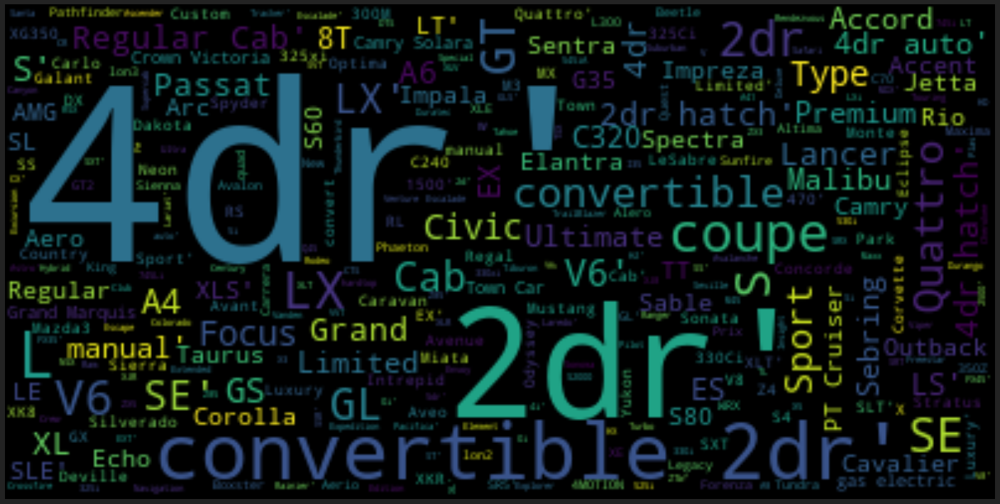

In [130]:
fig = plt.figure(figsize=(25, 15))

plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show();

### Correlation Matrix

In [131]:
cars.corr()

,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
MSRP,1.000000,0.999132,0.573238,0.649742,0.827296,-0.475916,-0.440523,0.447987,0.151665,0.171060
Invoice,0.999132,1.000000,0.566019,0.645226,0.824079,-0.471304,-0.435452,0.441916,0.148003,0.165645
EngineSize,0.573238,0.566019,1.000000,0.908002,0.793250,-0.717860,-0.725901,0.808707,0.638947,0.636015
Cylinders,0.649742,0.645226,0.908002,1.000000,0.810341,-0.684402,-0.676100,0.742209,0.546730,0.547783
Horsepower,0.827296,0.824079,0.793250,0.810341,1.000000,-0.677034,-0.647425,0.631758,0.387561,0.382386
MPG_City,-0.475916,-0.471304,-0.717860,-0.684402,-0.677034,1.000000,0.940993,-0.740418,-0.508029,-0.504184
MPG_Highway,-0.440523,-0.435452,-0.725901,-0.676100,-0.647425,0.940993,1.000000,-0.793615,-0.525457,-0.468756
Weight,0.447987,0.441916,0.808707,0.742209,0.631758,-0.740418,-0.793615,1.000000,0.760857,0.689168
Wheelbase,0.151665,0.148003,0.638947,0.546730,0.387561,-0.508029,-0.525457,0.760857,1.000000,0.889838
Length,0.171060,0.165645,0.636015,0.547783,0.382386,-0.504184,-0.468756,0.689168,0.889838,1.000000


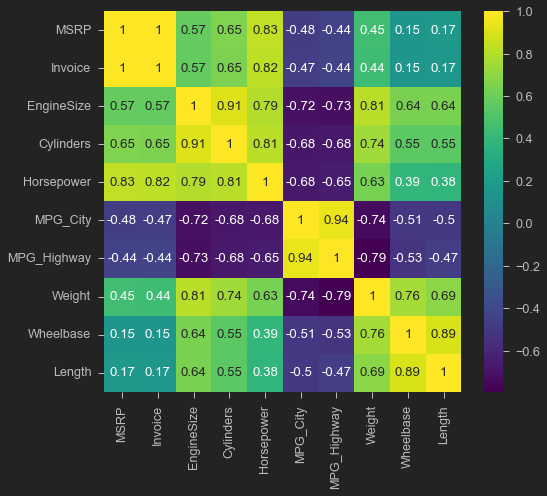

In [140]:
sns.heatmap(cars.corr(), annot=True, cmap='viridis');

In [145]:
cars.corr()['MSRP'].sort_values(ascending=False)

MSRP           1.000000
Invoice        0.999132
Horsepower     0.827296
Cylinders      0.649742
EngineSize     0.573238
Weight         0.447987
Length         0.171060
Wheelbase      0.151665
MPG_Highway   -0.440523
MPG_City      -0.475916
Name: MSRP, dtype: float64

+ It seems that `Invoice` and `Horsepower` have the highest correlation with `MSRP`. We will ignore `Invoice` as it is just totally same as price.
+ The higer the price, of course The invoice will be larger.

# Part 5: Prepare the Data before Model Training

In [147]:
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,36945,33337,3.5,6.0,265,17,23,4451,106,189


In [148]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         426 non-null    object 
 1   Model        426 non-null    object 
 2   Type         426 non-null    object 
 3   Origin       426 non-null    object 
 4   DriveTrain   426 non-null    object 
 5   MSRP         426 non-null    int32  
 6   Invoice      426 non-null    int32  
 7   EngineSize   426 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   426 non-null    int64  
 10  MPG_City     426 non-null    int64  
 11  MPG_Highway  426 non-null    int64  
 12  Weight       426 non-null    int64  
 13  Wheelbase    426 non-null    int64  
 14  Length       426 non-null    int64  
dtypes: float64(2), int32(2), int64(6), object(5)
memory usage: 66.1+ KB


### One-Hot Encoding for "Make", "Model", "Type", "Origin", and "DriveTrain"

In [149]:
df_dummies = pd.get_dummies(cars, columns=['Make', 'Model', 'Type', 'Origin', 'DriveTrain'])
df_dummies.head(2)

,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length,...,Type_Sedan,Type_Sports,Type_Truck,Type_Wagon,Origin_Asia,Origin_Europe,Origin_USA,DriveTrain_All,DriveTrain_Front,DriveTrain_Rear
0,36945,33337,3.5,6.0,265,17,23,4451,106,189,...,0,0,0,0,1,0,0,1,0,0
1,23820,21761,2.0,4.0,200,24,31,2778,101,172,...,1,0,0,0,1,0,0,0,1,0


### Drop `Invoice` Feature
as it is similiar to MSRP, we gonna drop it

In [150]:
df_data = df_dummies.drop(['Invoice'], axis=1)
df_data.head(1)

,MSRP,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length,Make_Acura,...,Type_Sedan,Type_Sports,Type_Truck,Type_Wagon,Origin_Asia,Origin_Europe,Origin_USA,DriveTrain_All,DriveTrain_Front,DriveTrain_Rear
0,36945,3.5,6.0,265,17,23,4451,106,189,1,...,0,0,0,0,1,0,0,1,0,0


In [156]:
df_data.shape

(426, 482)

### Separate Features and Label

In [151]:
X = df_data.drop(['MSRP'], axis=1)
y = df_data['MSRP']

### Train Test Split

In [153]:
from sklearn.model_selection import train_test_split

In [154]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [155]:
X_train.shape, X_test.shape

((340, 481), (86, 481))

In [157]:
y_train.shape, y_test.shape

((340,), (86,))

# Part 6: Multiple Linear Regression Model

## 1) Simple Linear Regression Intuition

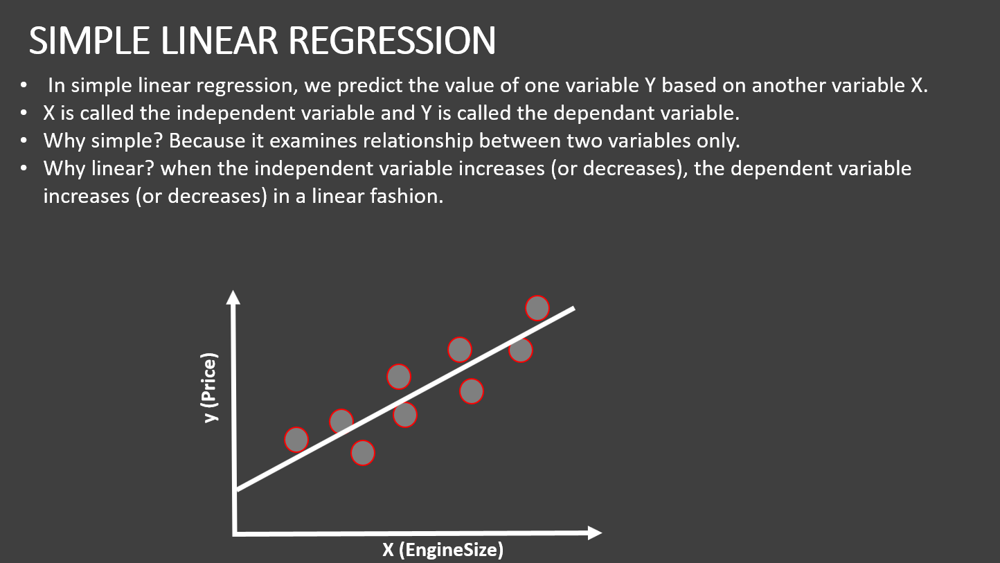

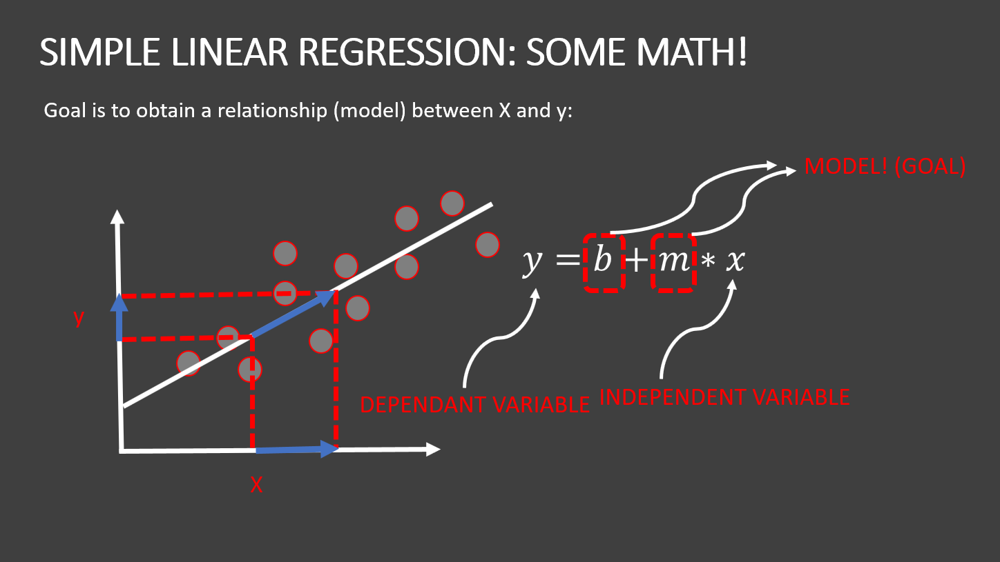

## 2) Multiple Linear Regression: Inituition

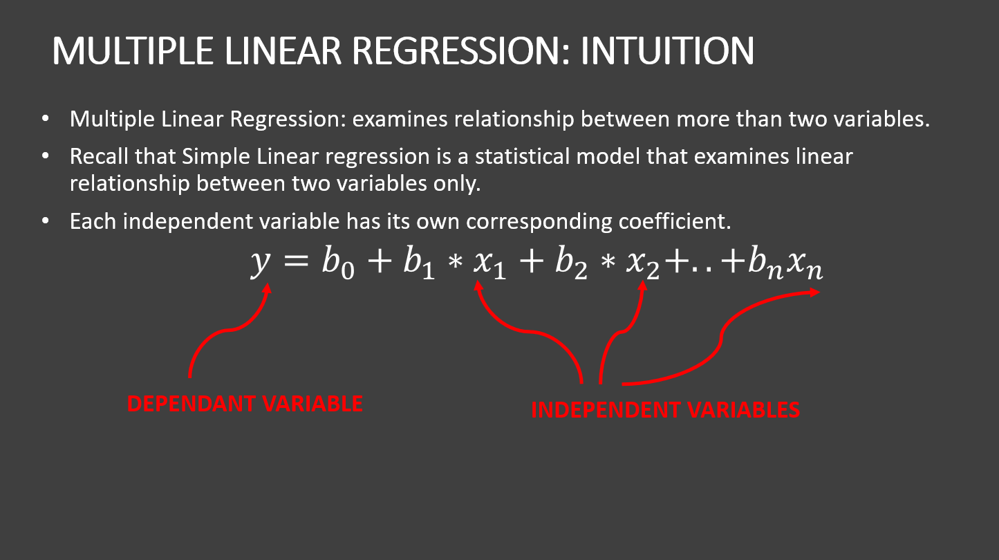

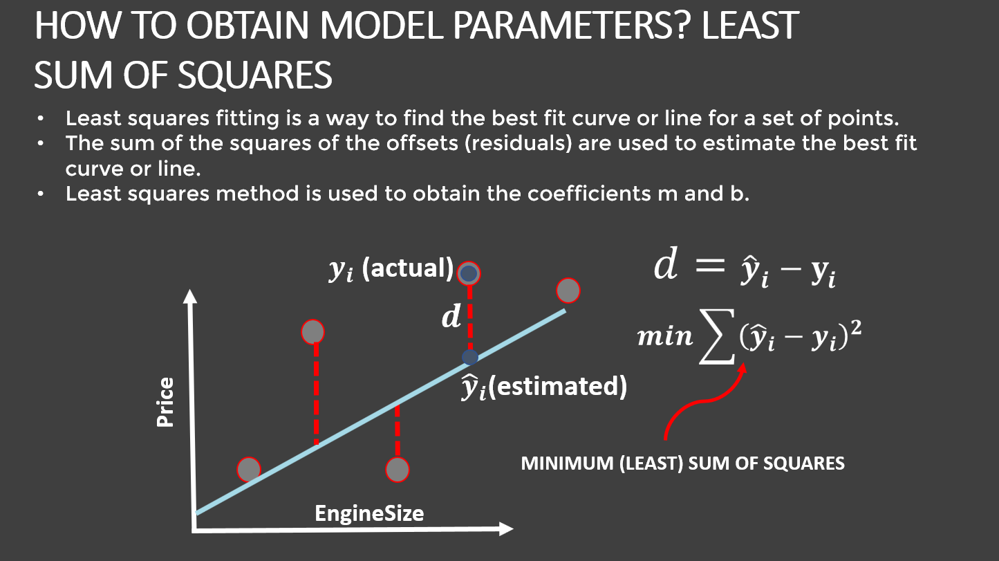

In [159]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [160]:
linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train, y_train)

LinearRegression()

In [163]:
score_linear_regression = linear_regression_model.score(X_test, y_test)
score_linear_regression

0.8544407384670859

# Part 7: Decision Tree & Random Forest Models

In [164]:
# Photo Credits:
# https://creazilla.com/nodes/22202-giraffe-clipart 
# https://pixy.org/4569488/ 
# https://pixabay.com/illustrations/monkey-animal-gorilla-zoo-nature-4187960/ 
# https://creazilla.com/nodes/15581-running-tiger-clipart 

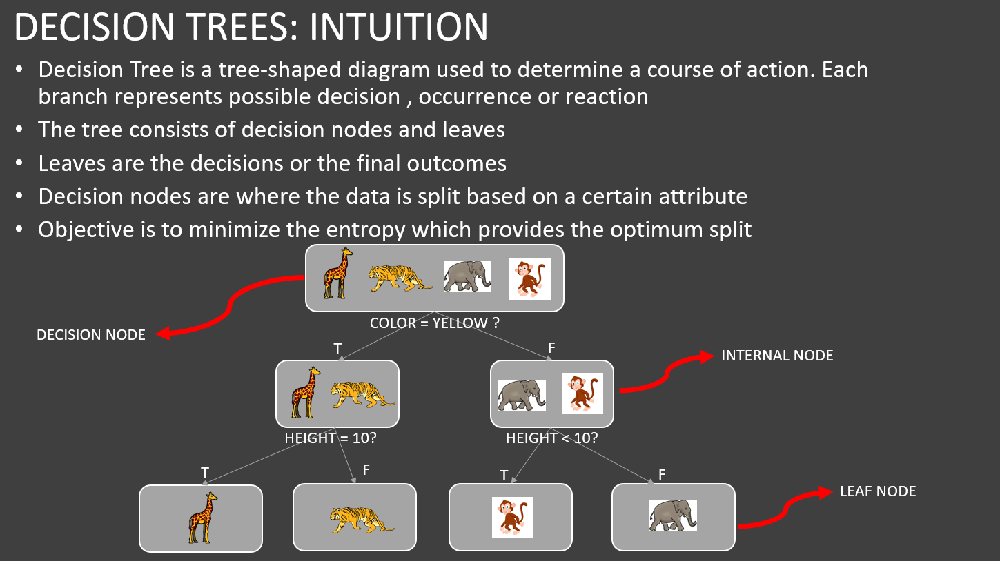

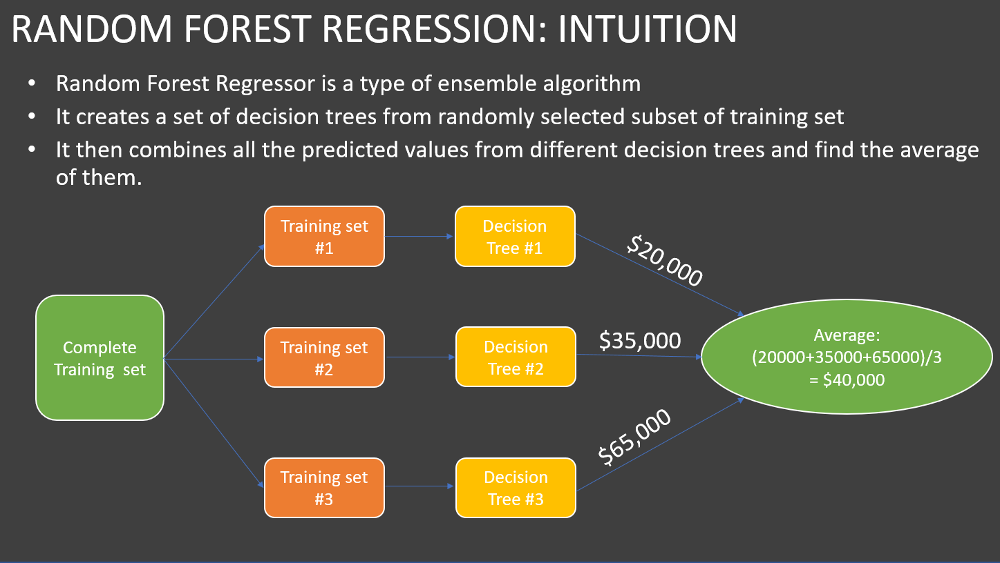

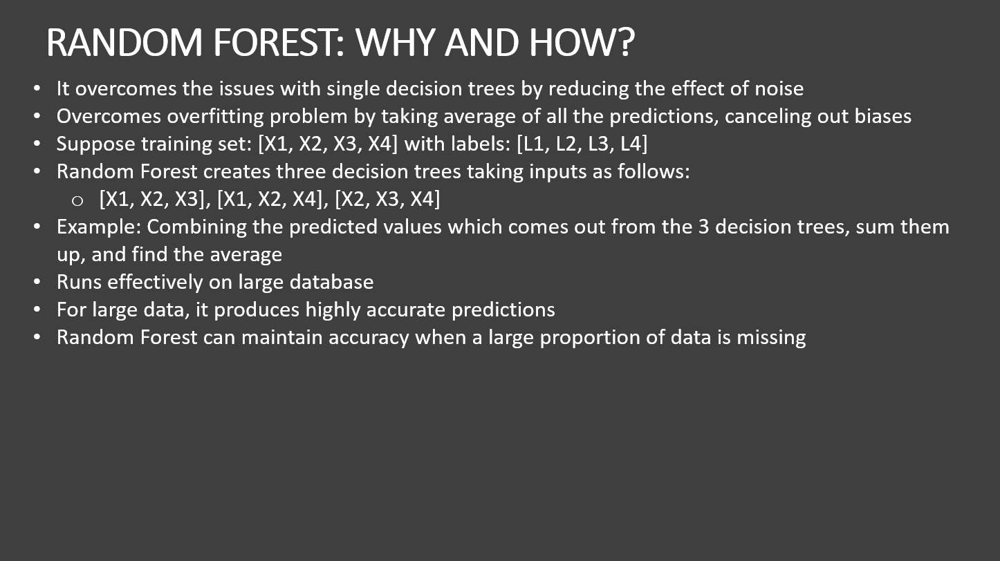

In [165]:
from sklearn.tree import DecisionTreeRegressor

In [167]:
decision_tree_model = DecisionTreeRegressor()
decision_tree_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [180]:
score_decision_tree = decision_tree_model.score(X_test, y_test)

round(score_decision_tree*100, 2)

84.47

In [170]:
from sklearn.ensemble import RandomForestRegressor

In [171]:
random_forest_model = RandomForestRegressor(n_estimators=5, max_depth=5)
random_forest_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=5, n_estimators=5)

In [181]:
score_random_forest = random_forest_model.score(X_test, y_test)


round(score_random_forest*100, 2)

81.04

# Part 8: XG-BOOST Algorithm

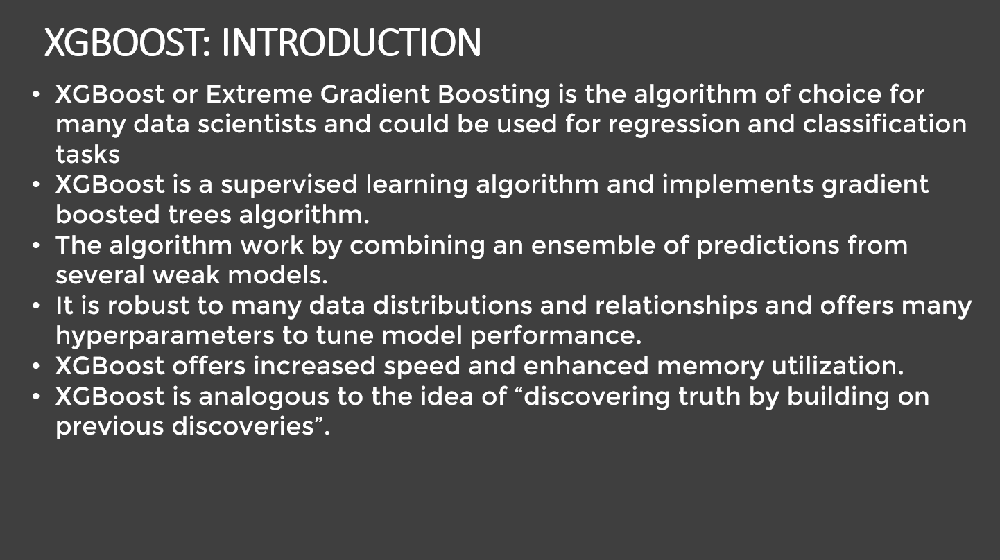

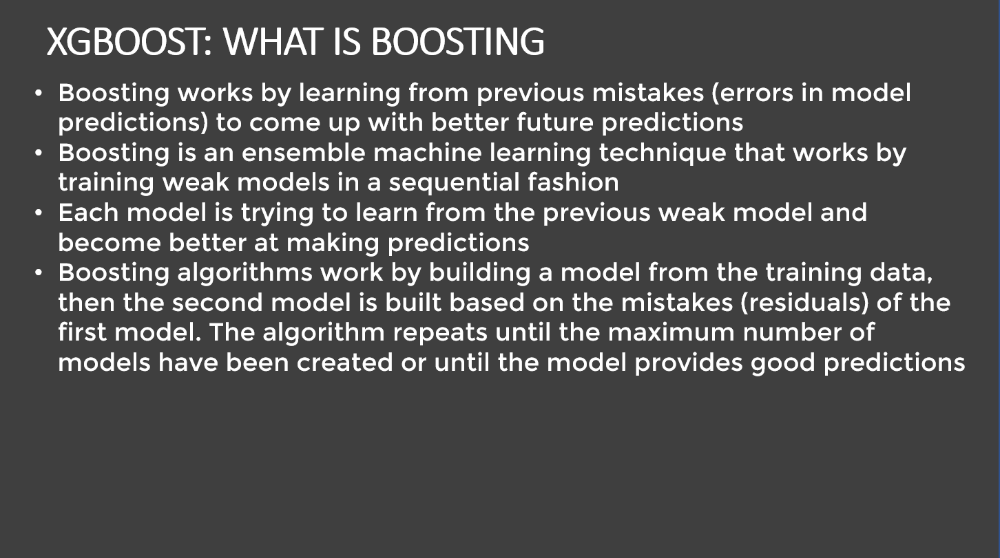

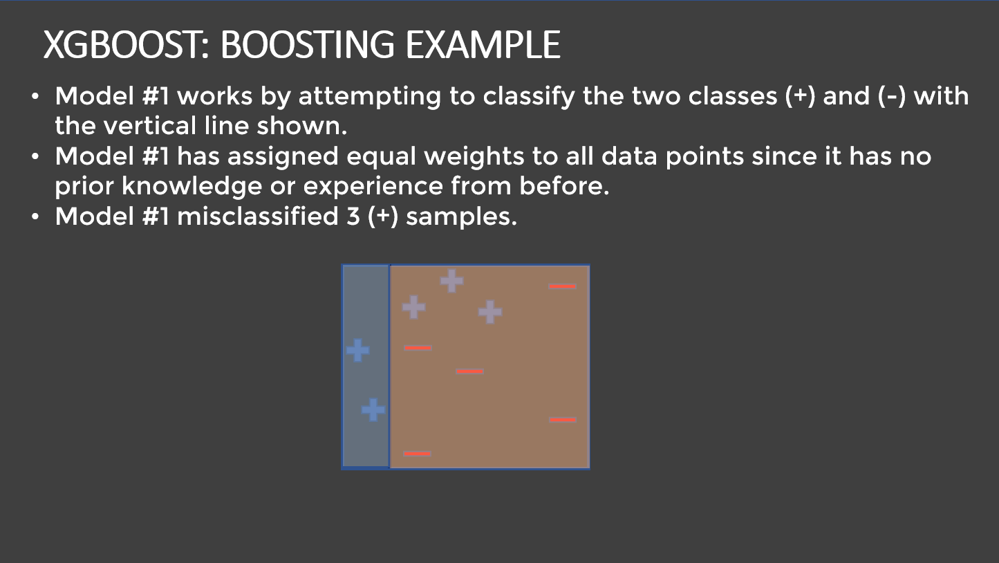

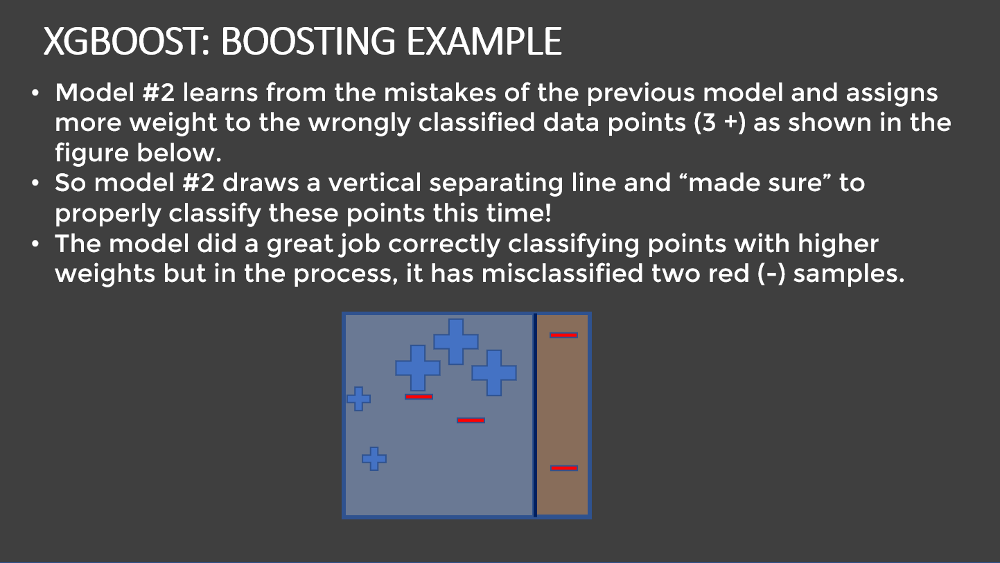

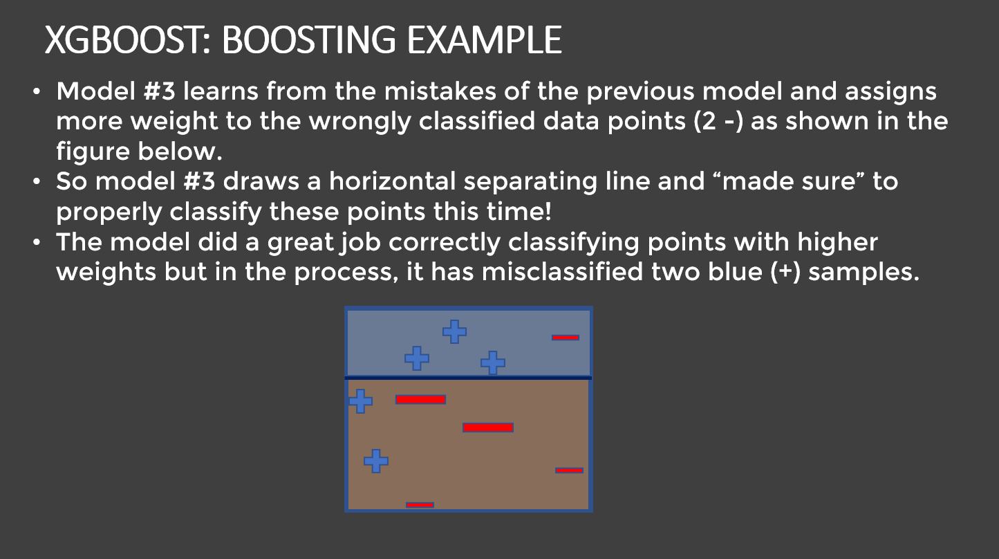

...

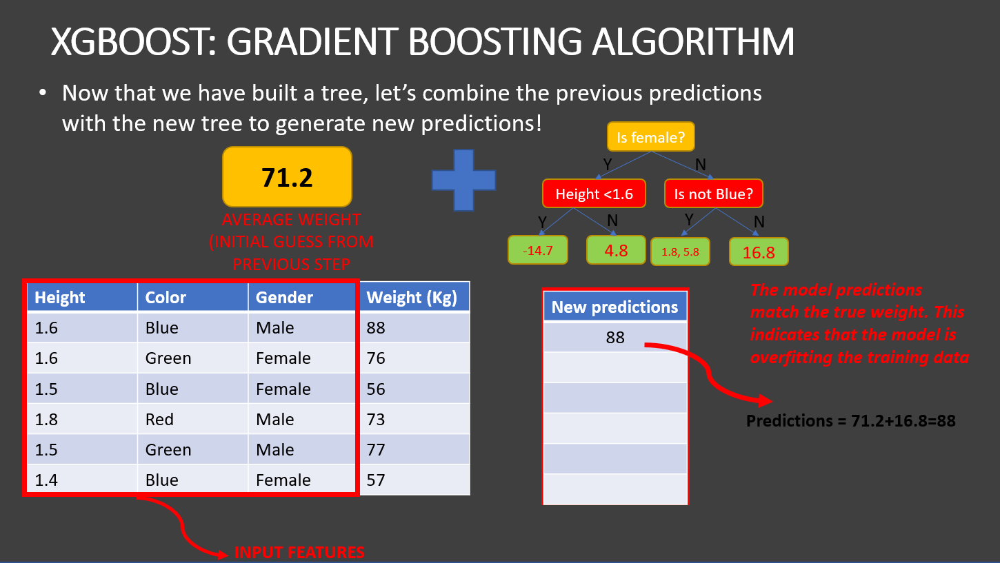

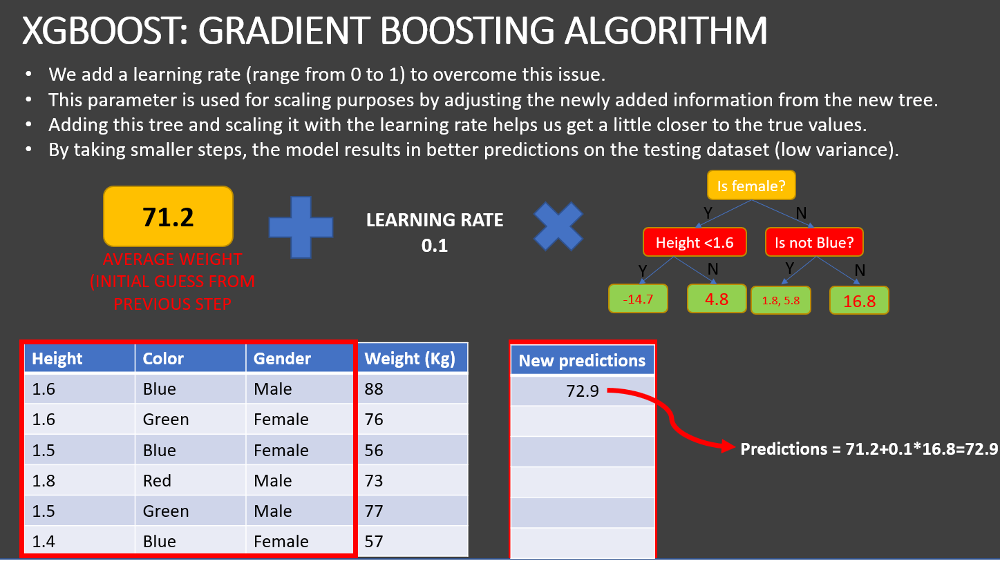

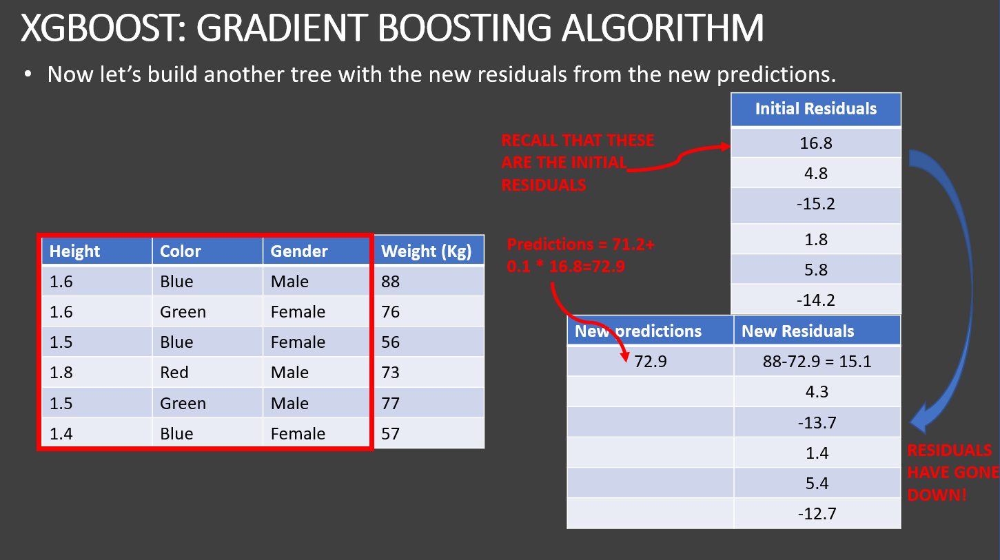

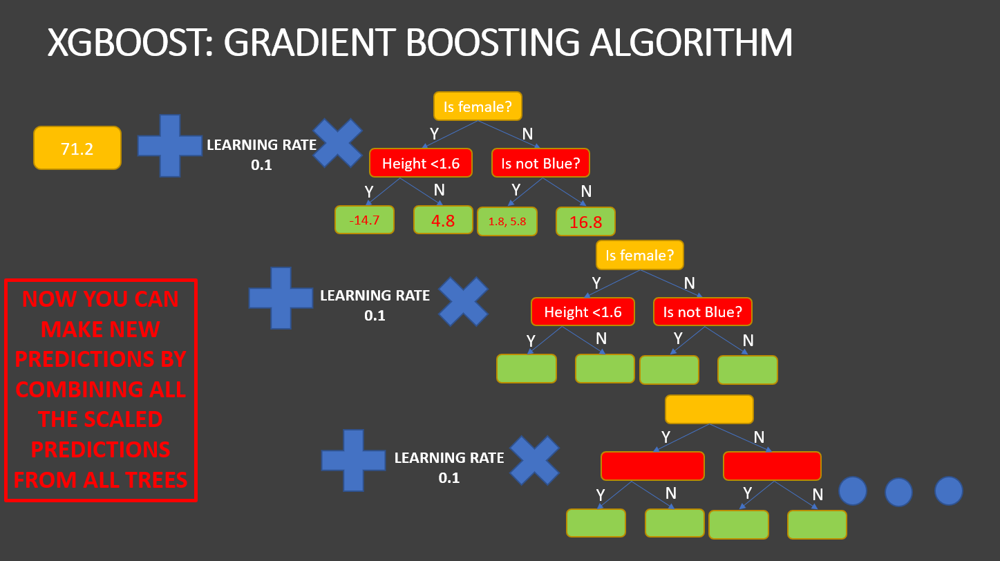

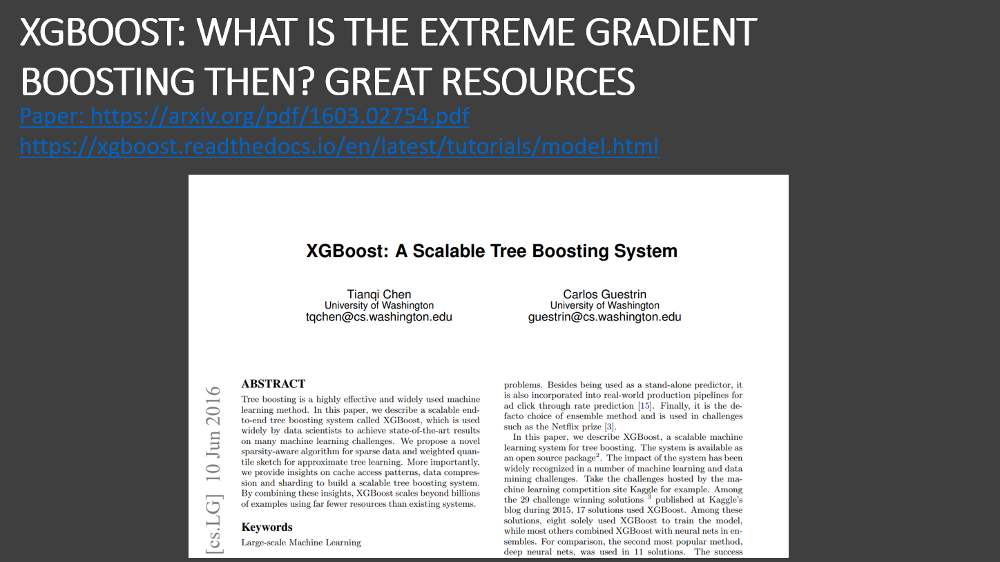

# Part 9: XG-BOOST Regressor Model

In [174]:
from xgboost import XGBRegressor

In [175]:
xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [179]:
xgb_score = xgb_model.score(X_test, y_test)

round(xgb_score*100, 2)

84.43

# Part 10: Compare Models and Calculate Regression KPIs

## Helper Functions

In [205]:
# helper function to plot
def plot_results(model, model_type, y_pred, y_true, color, marker):
    fig = sns.regplot(x=y_pred, y=y_test, color=color, marker=marker)
    fig.set(title=model_type, xlabel='Predicted Price of Used Cars($)', ylabel='Actual Price of the used cars ($)');

In [206]:
# help function for score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_score(y_pred, y_true):
    MAE = round(mean_absolute_error(y_pred, y_true), 2)
    MSE = round(mean_squared_error(y_pred, y_true), 2)
    RMSE = round(np.sqrt(MSE), 2)
    r2 = round(r2_score(y_pred, y_true), 2)
    
    print('MAE: ', MAE)
    print('MSE: ', MSE)
    print('RMSE: ', RMSE)
    print('R^2 Score: ', r2)

## Linear Regression Model

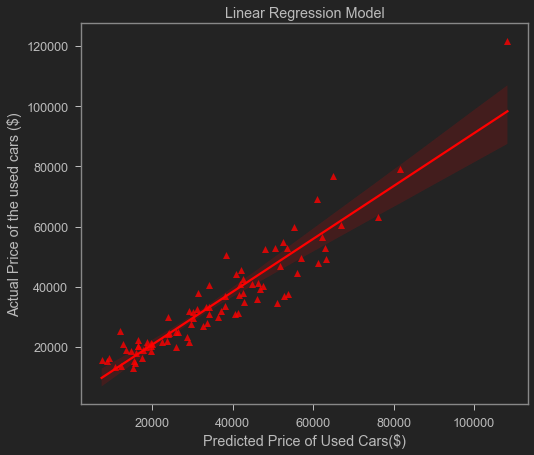

In [207]:
# Linear Regression Model
predictions_linear_regression = linear_regression_model.predict(X_test)
plot_results(linear_regression_model, 'Linear Regression Model', predictions_linear_regression, y_test, 'red', '^')


In [208]:
get_score(predictions_linear_regression, y_test)

MAE:  5198.21
MSE:  45067768.89
RMSE:  6713.25
R^2 Score:  0.87


## Random Forest Model

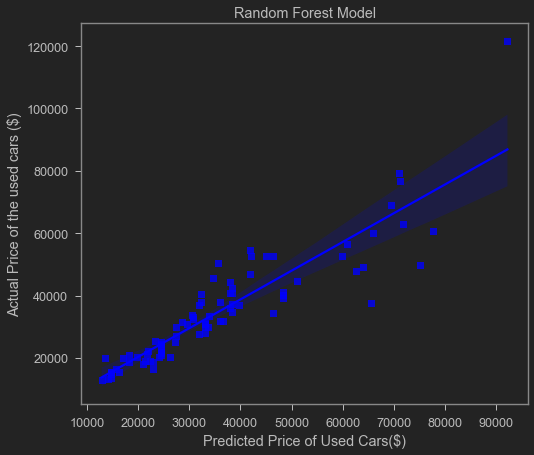

In [210]:
predictions_random_forest = random_forest_model.predict(X_test)
plot_results(random_forest_model, 'Random Forest Model', predictions_random_forest, y_test, 'blue', 's')

In [204]:
get_score(predictions_random_forest, y_test)

MAE:  5102.18
MSE:  58695870.89
RMSE:  7661.32
R^2 Score:  0.8


## XG-BOOST Model

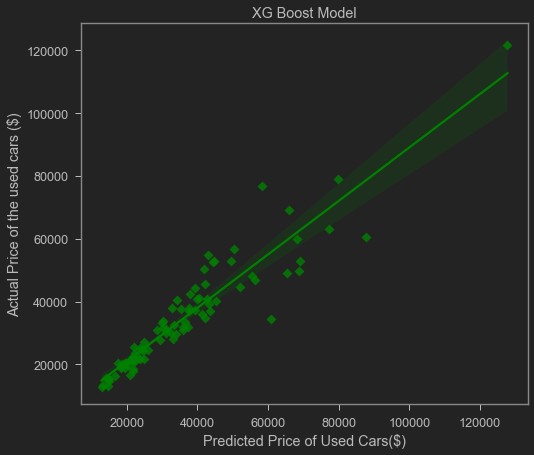

In [213]:
predictions_XGBoost = xgb_model.predict(X_test)
plot_results(xgb_model, 'XG Boost Model', predictions_XGBoost, y_test, 'green', 'D')

In [214]:
get_score(predictions_XGBoost, y_test)

MAE:  4373.79
MSE:  48203566.11
RMSE:  6942.88
R^2 Score:  0.87


-----------